In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from mpl_toolkits.basemap import Basemap

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(2347268.222744084, 4518079.266407729, ' Seattle')

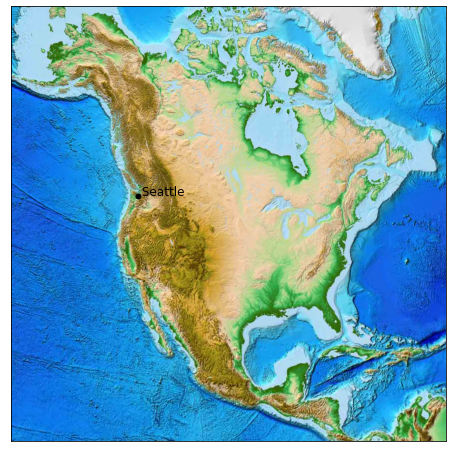

In [4]:
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution=None,
            width=8E6, height=8E6, 
            lat_0=45, lon_0=-100,)
m.etopo(scale=1, alpha=1) #scale seems to be the resolution

# Map (long, lat) to (x, y) for plotting
x, y = m(-122.3, 47.6)
plt.plot(x, y, 'ok', markersize=5)
plt.text(x, y, ' Seattle', fontsize=12)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


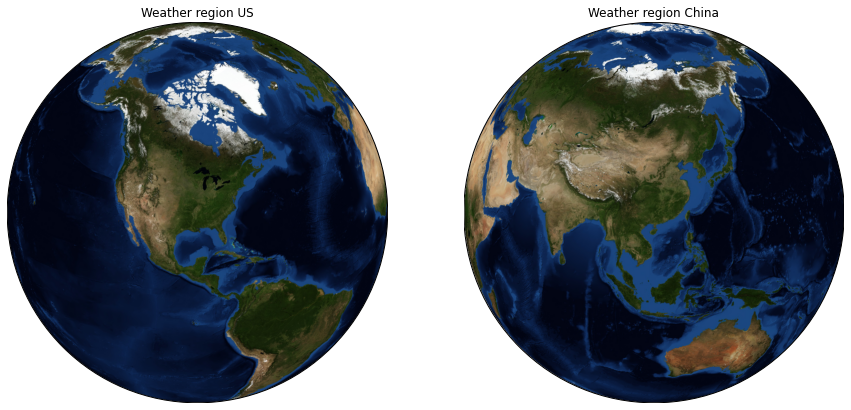

In [6]:
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(15, 2*15))
m1 = Basemap(projection='ortho', resolution=None, lat_0=35, lon_0=-90,ax=ax[0])
m1.bluemarble(scale=0.5)
ax[0].set_title('Weather region US')

m2 = Basemap(projection='ortho', resolution=None, lat_0=25, lon_0=110,ax=ax[1])
m2.bluemarble(scale=0.5)
ax[1].set_title('Weather region China')

plt.savefig('Zoom_out_weather_regios.pdf')

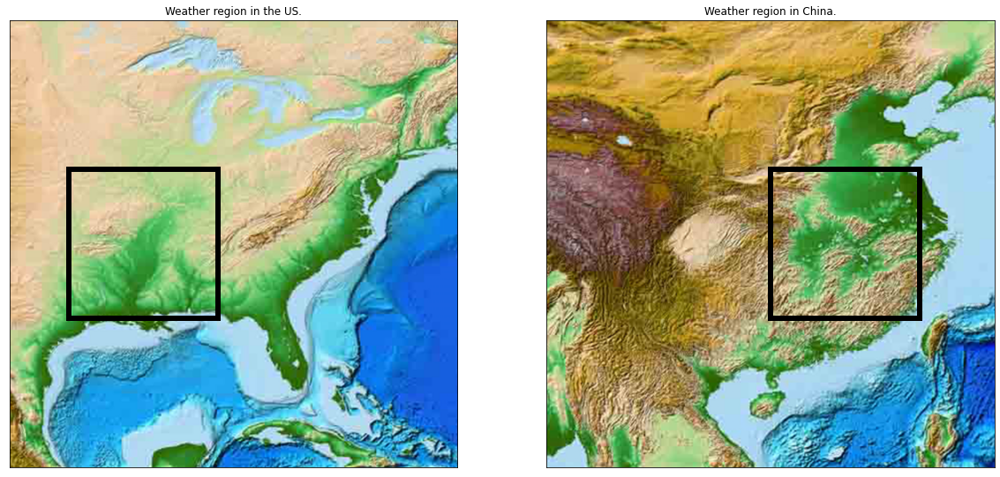

In [7]:
#For the US: We choose the following coordinates:
#West: 96 W -96
#North:40 N +40
#East: 86 W -86
#South: 30 N +30
#For China: We choose the following coordinates:
#West: 105 E +105
#North: 35 N +35
#East: 115 E +115
#South: 25 N +25
#For China: Alternative region:
#West: 105 E +105
#North: 35 N +35
#East: 115 E +115
#South: 25 N +25

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,3*20))
scale=2
m_1 = Basemap(llcrnrlon=-100,llcrnrlat=20,urcrnrlon=-70,urcrnrlat=50, resolution=None,ax=ax[0])
m_1.etopo(scale=scale, alpha=1)
rec_1=Rectangle((-96,30), 10, 10, angle=0.0,fill=False,linewidth=6)

ax[0].add_patch(rec_1)
ax[0].set_title("Weather region in the US.")

m_2 = Basemap(llcrnrlon=95,llcrnrlat=15,urcrnrlon=125,urcrnrlat=45, resolution=None,ax=ax[1])
m_2.etopo(scale=scale, alpha=1)
rec_2=Rectangle((110,25), 10, 10, angle=0.0,fill=False,linewidth=6)

ax[1].add_patch(rec_2)
ax[1].set_title("Weather region in China.")
'''
m_3 = Basemap(llcrnrlon=95,llcrnrlat=15,urcrnrlon=125,urcrnrlat=45, resolution=None,ax=ax[2])
m_3.etopo(scale=scale, alpha=1)
rec_3=Rectangle((110,25), 10, 10, angle=0.0,fill=False,linewidth=6)

ax[2].add_patch(rec_3)
ax[2].set_title("Alternative weather region in China.")
'''
plt.savefig("Weather_regios.pdf")

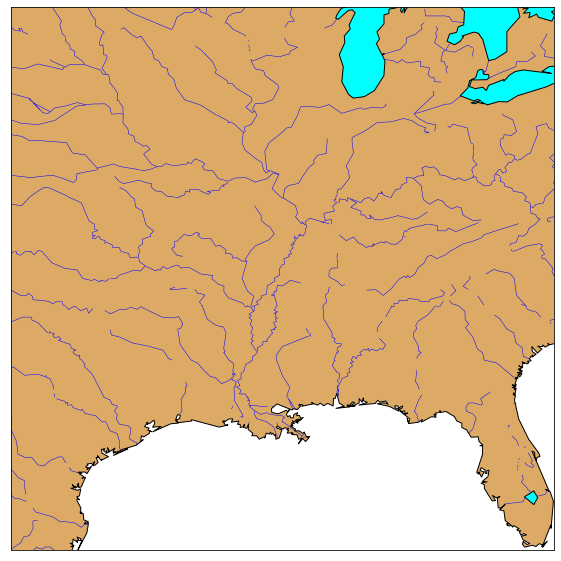

In [6]:
#Example self-drawn plot:
fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
m = Basemap(llcrnrlon=-100,llcrnrlat=25,urcrnrlon=-80,urcrnrlat=45, resolution='l',ax=ax)
#m.etopo(scale=scale, alpha=1,ax=ax)
#m.drawmapboundary(fill_color='aqua',ax=ax)
m.fillcontinents(color='#ddaa66', lake_color='aqua',zorder=0,ax=ax)
m.drawrivers(color='#0000ff')
m.drawcoastlines()
#m.quiver(X[:,1],X[:,0],Y_wind[:,0],Y_wind[:,1],ax=ax)
#m.barbs(X[:,1],X[:,0],Y_wind[:,0],Y_wind[:,1], pivot='middle', barbcolor='#333333',ax=ax)


In [83]:
#Get random data:
import pandas as pd
filename="ERA5_China/Data/1980_ERA5_China.pickle"
my_data=pd.read_pickle(filename)

In [92]:
def give_random_example(data):
    n_rows=len(data.index)
    ind=np.random.randint(low=0,high=n_rows)
    single_time=data['datetime'].iloc[ind]
    single_data=data[data['datetime']==single_time]
    X=single_data[['Longitude','Latitude']].to_numpy()
    Y_wind_low=single_data[['wind_10m_east','wind_10m_north']].to_numpy()
    Y_wind_high=single_data[['wind_100m_east','wind_100m_north']].to_numpy()
    Y_temp=single_data['t_in_Cels'].to_numpy()
    Y_press=single_data['sp_in_kPa'].to_numpy()
    Y_height=single_data['height_in_m'].to_numpy()
    return(X,Y_wind_low,Y_wind_high,Y_temp,Y_press,Y_height,str(single_time))

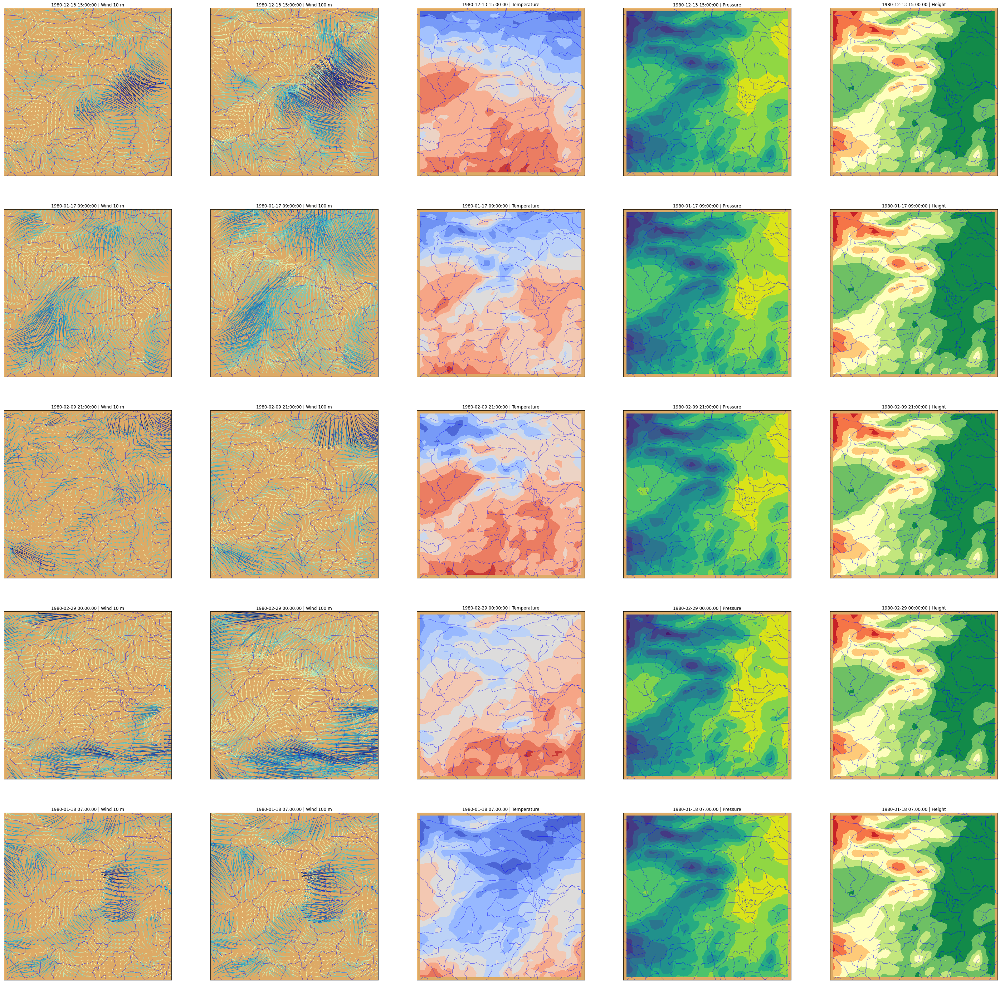

In [97]:

n_samples=5
n_var=5
#Example self-drawn plot:
fig,ax = plt.subplots(nrows=n_samples,ncols=n_var,figsize=(n_samples*10,n_var*10))
for i in range(n_samples):
    X,Y_wind_low,Y_wind_high,Y_temp,Y_press,Y_height,time=give_random_example(my_data)
    for j in range(n_var):
        pass
        #US:
        #m = Basemap(llcrnrlon=-96.2,llcrnrlat=29.8,urcrnrlon=-85.8,urcrnrlat=40.2, resolution='l',ax=ax[i][j])
        #China:
        m = Basemap(llcrnrlon=104.8,llcrnrlat=24.8,urcrnrlon=115.2,urcrnrlat=35.2, resolution='l',ax=ax[i][j])
        #m.etopo(scale=scale, alpha=1,ax=ax)
        #m.drawmapboundary(fill_color='aqua',ax=ax)
        m.fillcontinents(color='#ddaa66', lake_color='aqua',zorder=0,ax=ax[i][j])
        m.drawrivers(color='#0000ff')
        #m.drawcoastlines()
    #Wind plot (Note that quiver takes the left-right and up-down magnitudes (since we have direction to the north we need to reverse it):
    m.quiver(X[:,0],X[:,1],Y_wind_low[:,0],-Y_wind_low[:,1],np.sqrt(Y_wind_low[:,0]**2+Y_wind_low[:,1]**2),ax=ax[i][0],scale=40,                        cmap=plt.cm.YlGnBu)
    ax[i][0].set_title(time+" | Wind 10 m")
    #Wind plot (Note that quiver takes the left-right and up-down magnitudes (since we have direction to the north we need to reverse it):
    m.quiver(X[:,0],X[:,1],Y_wind_high[:,0],-Y_wind_high[:,1],np.sqrt(Y_wind_high[:,0]**2+Y_wind_high[:,1]**2),ax=ax[i][1],scale=40,                        cmap=plt.cm.YlGnBu)
    ax[i][1].set_title(time+" | Wind 100 m")
    #Temperature plot:
    m.contourf(X[:,0],X[:,1],Y_temp,tri=True,ax=ax[i][2],cmap=plt.cm.coolwarm)
    ax[i][2].set_title(time+" | Temperature")
    #Pressure plot:
    m.contourf(X[:,0],X[:,1],Y_press,tri=True,ax=ax[i][3])
    ax[i][3].set_title(time+" | Pressure")
    #Height plot:
    m.contourf(X[:,0],X[:,1],Y_height,tri=True,ax=ax[i][4],cmap=plt.cm.RdYlGn_r)
    ax[i][4].set_title(time+" | Height")

fig.show()
plt.savefig("Test_plot_China.pdf")

In [ ]:
map = Basemap(llcrnrlon=3.75,llcrnrlat=39.75,urcrnrlon=4.35,urcrnrlat=40.15, epsg=5520)
#http://server.arcgisonline.com/arcgis/rest/services

map.arcgisimage(service='ESRI_Imagery_World_2D', xpixels = 1500, verbose= True)
plt.show()
